<a href="https://colab.research.google.com/github/louisfh/ESA_2023/blob/main/ESA_tutorial_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ESA 2023 workshop OpenSoundscape tutorial

This tutorial will walk you through a simple example of using OpenSoundscape. We will use a Convolutional Neural Network classifier to get predictions based on audio you recorded during the workshop.

There are more tutorials available on the OpenSoundscape website  can guide you through working with Audio and Spectrograms, training a classifier, using our signal processing RIBBIT algorithm.

 http://opensoundscape.org/en/latest/

## Set up

We first need to install opensoundscape and its dependencies. This might take a minute or two. To do this on your own machine from a terminal, you just need to run `pip install opensoundscape`. You may need to 'restart your runtime' after installation.

In [1]:
!pip install opensoundscape

### Import OpenSoundscape
To use OpenSoundscape, we also need to import it. To make your code a bit easier to read, we will import some specific functions and classes from OpenSoundscape.

In [8]:
import opensoundscape

### Load in the audio you just recorded on an AudioMoth

To work with the audio you just recorded, we will need to upload the file. If you're working with OpenSoundscape on your local machine, you won't need to do this. Steps:


1.   Execute the cell below.
2.   Below the cell, click the "choose files" button and find your audio file to upload.

In [3]:
from google.colab import files

uploaded = files.upload()
files = list(uploaded.keys())
filename = files[0]

Saving MSD-0003_20180427_5minstart00-00.wav to MSD-0003_20180427_5minstart00-00.wav


# Visualize your Audio

Let's create an audio object, and then display a spectrogram of the first 10 seconds of our audio as a spectrogram.

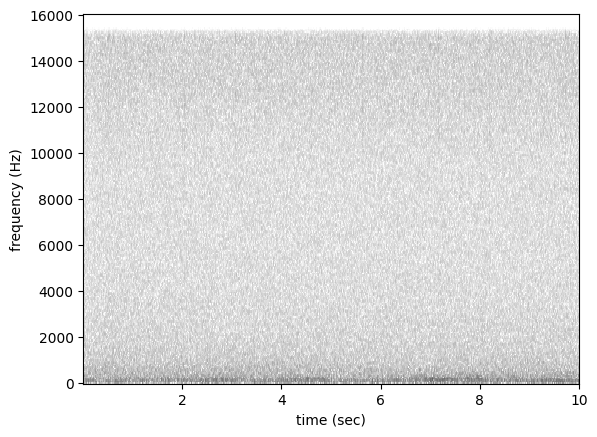

In [9]:
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

audio = Audio.from_file(filename, sample_rate=32000)
spectrogram = Spectrogram.from_audio(audio)
spectrogram.trim(0,10).plot()

## Use a classifier to get predictions

To save some time we trained a model already. This model is a Convolutional Neural Network (CNN) trained to recognize spectrograms of 38 bird species in 5 second long spectrograms.

This classifier is far from perfect! We will explore how well it identifies bird vocalizations later on.

In [7]:
!wget https://pitt.box.com/shared/static/sbws0r6ce9osveozhvbpvy7gdc7r8hld.model -O trained.model &> /dev/null

In [13]:
from opensoundscape import load_model
model = load_model("trained.model")

ModuleNotFoundError: ignored

Let's use this model make predictions on the audio with our CNN!

The model produces scores between -inf and +inf for each class. We use a 'softmax' activation function to take these scores and make them sum to 1. These scores represent the confidence the model has that the audio segment contains a species within it, but **these are not probabilities!**


In [ ]:
predictions = model.predict([filename],activation_layer='softmax')
predictions

[]


Red-winged Blackbird  \
file                start_time end_time                         
19700101_000214.WAV 0.0        5.0               3.945331e-05   
                    5.0        10.0              4.598892e-12   
                    10.0       15.0              2.945514e-07   
                    15.0       20.0              1.648490e-11   
                    20.0       25.0              2.741676e-11   
                    25.0       30.0              7.465118e-17   
                    30.0       35.0              1.260185e-14   
                    35.0       40.0              2.090256e-21   
                    40.0       45.0              3.794116e-08   
                    45.0       50.0              1.919794e-06   
                    50.0       55.0              8.112184e-01   
                    55.0       60.0              2.959007e-07   
                    60.0       65.0              4.286935e-04   
                    65.0       70.0              2.475939e-07   

                                         Tufted Titmouse  Cedar Waxwing  \
file                start_time end_time                                   
19700101_000214.WAV 0.0        5.0          1.377901e-06   5.528769e-12   
                    5.0        10.0         3.965255e-02   5.817980e-12   
                    10.0       15.0         1.630450e-08   6.533067e-06   
                    15.0       20.0         5.700211e-13   2.459459e-11   
                    20.0       25.0         9.123090e-13   1.396188e-11   
                    25.0       30.0         1.563395e-18   2.771416e-17   
                    30.0       35.0         2.718977e-15   9.148555e-12   
                    35.0       40.0         9.337723e-22   1.150927e-22   
                    40.0       45.0         2.616839e-11   4.382484e-13   
                    45.0       50.0         1.257563e-08   4.039325e-07   
                    50.0       55.0         6.495463e-08   1.677061e-08   
                    55.0       60.0         1.174915e-09   3.628949e-11   
                    60.0       65.0         1.158662e-04   1.883103e-08   
                    65.0       70.0         4.622413e-05   4.040351e-12   

                                         Canada Goose  Red-Shouldered Hawk  \
file                start_time end_time                                      
19700101_000214.WAV 0.0        5.0       3.926228e-04         2.034294e-11   
                    5.0        10.0      1.908473e-06         1.068819e-12   
                    10.0       15.0      1.639048e-06         1.367254e-11   
                    15.0       20.0      1.185168e-11         6.139901e-15   
                    20.0       25.0      7.784219e-12         6.669195e-14   
                    25.0       30.0      1.731141e-18         2.889554e-18   
                    30.0       35.0      1.784689e-12         3.967890e-16   
                    35.0       40.0      3.998987e-20         2.740948e-24   
                    40.0       45.0      1.289992e-07         1.258302e-13   
                    45.0       50.0      6.230953e-05         3.321902e-10   
                    50.0       55.0      8.530846e-05         3.266559e-09   
                    55.0       60.0      1.011020e-08         2.150445e-12   
                    60.0       65.0      1.771477e-01         2.572933e-09   
                    65.0       70.0      3.094716e-01         4.338353e-12   

                                         Northern Cardinal         Verry  \
file                start_time end_time                                    
19700101_000214.WAV 0.0        5.0            1.108489e-11  4.672921e-09   
                    5.0        10.0           2.128506e-08  1.659764e-04   
                    10.0       15.0           6.089157e-08  1.940216e-07   
                    15.0       20.0           6.184644e-12  3.210942e-10   
                    20.0       25.0           4.838755e-12  8.437627e-12   
                  

### Examine the scores
Lets's examine some spectrograms and their corresponding scores for the class Wood Thrush. We know from performance on some of our datasets that the Wood Thrush class performs relatively well.

score for Wood Thrush class [0-1]: 1.000


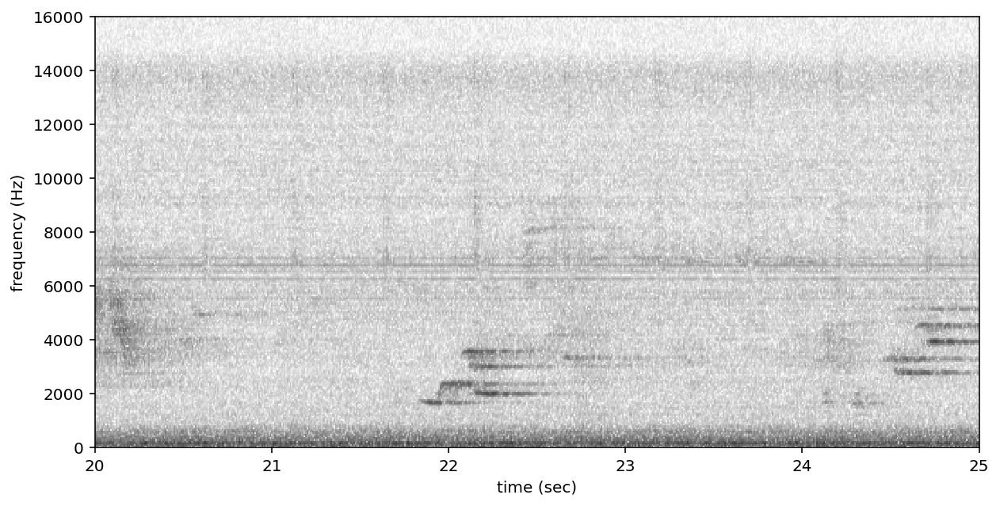

score for Wood Thrush class [0-1]: 0.999


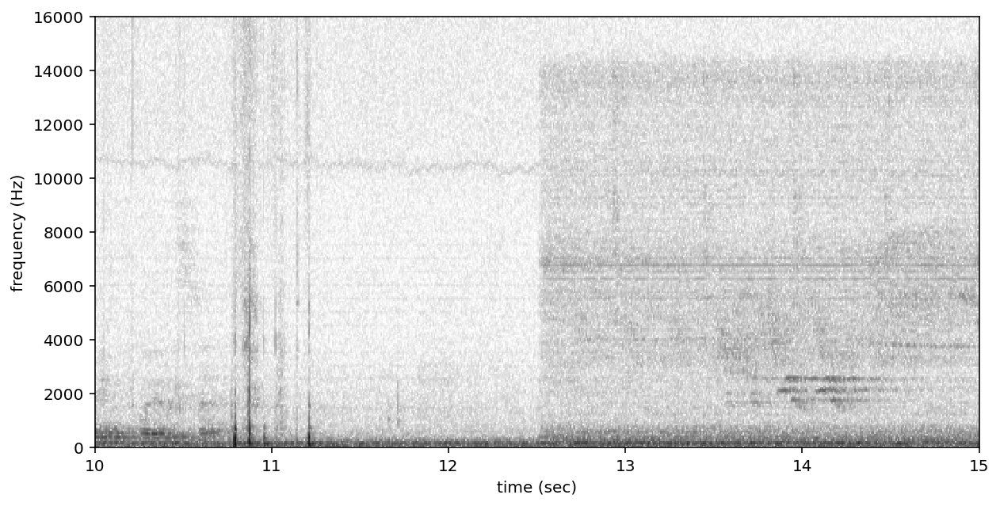

score for Wood Thrush class [0-1]: 0.000


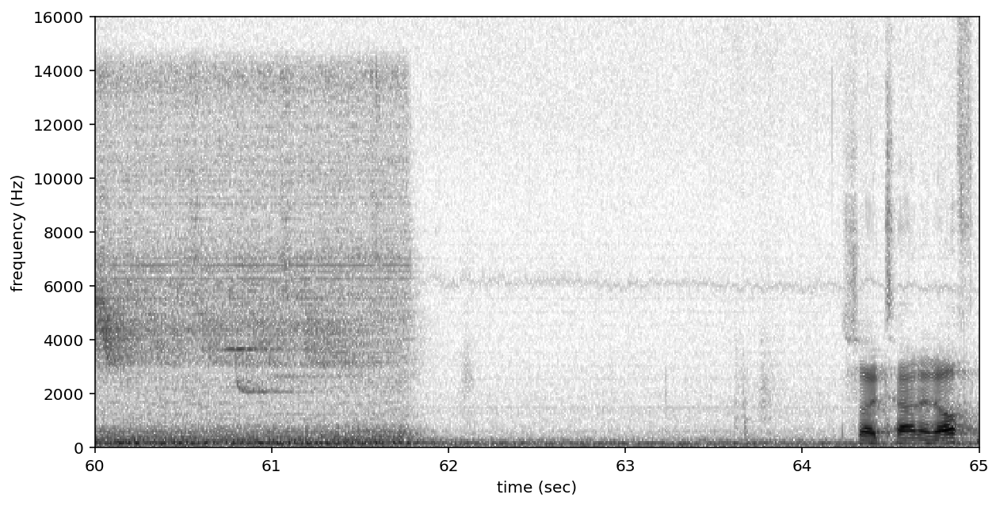

score for Wood Thrush class [0-1]: 1.000


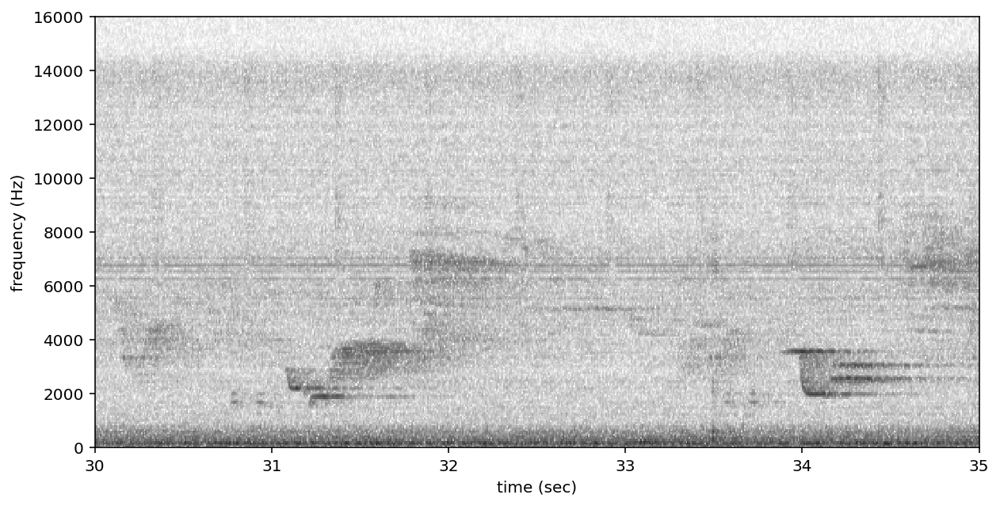

score for Wood Thrush class [0-1]: 0.334


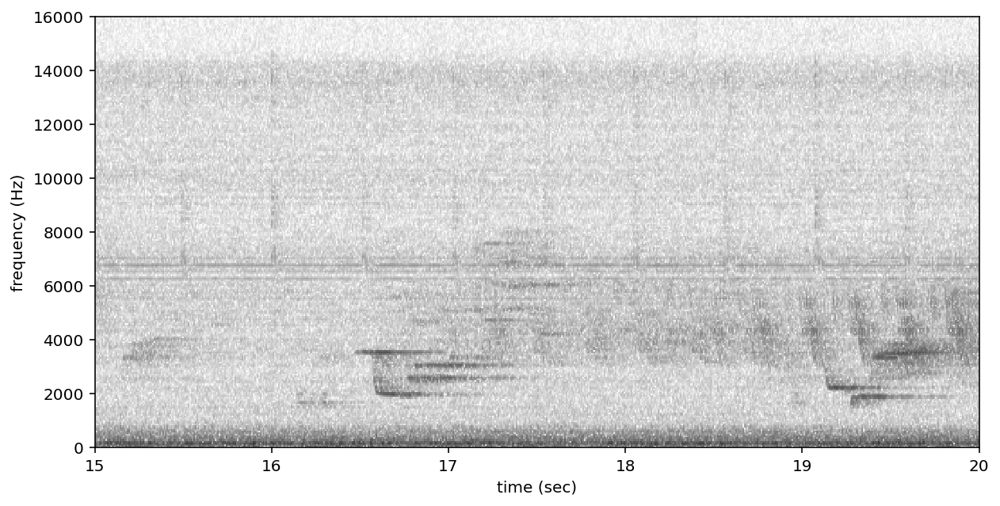

In [ ]:
for (file,clip_start_time,clip_end_time), row in preds.sample(5).iterrows():
  print(f"score for Wood Thrush class [0-1]: {row['Wood Thrush']:0.3f}")
  spectrogram.trim(clip_start_time,clip_end_time).plot()
  audio = Audio.from_file(file, offset = clip_start_time, duration = 5)
  ipd.display(ipd.Audio(audio.samples, rate = 32000))

Let's print the max score in the entire audio file for each species that had a score of at least 0.1.

This model is far from perfect - there could well be some errors in these scores like the sounds of human talking being classified as Common Raven! Errors like these suggest we need to change our model training process by e.g. adding Humans talking as negatives into the training dataset.

In [ ]:
np.round(preds.max()[preds.max()>0.1],3)

Red-winged Blackbird    0.811
Canada Goose            0.309
American Crow           0.524
Common Raven            0.998
Wood Thrush             1.000
Ovenbird                1.000
dtype: float32

Now let's look at clips that scored over 0.1 for a species of our choice:

score for Ovenbird class [0-1]: 0.666


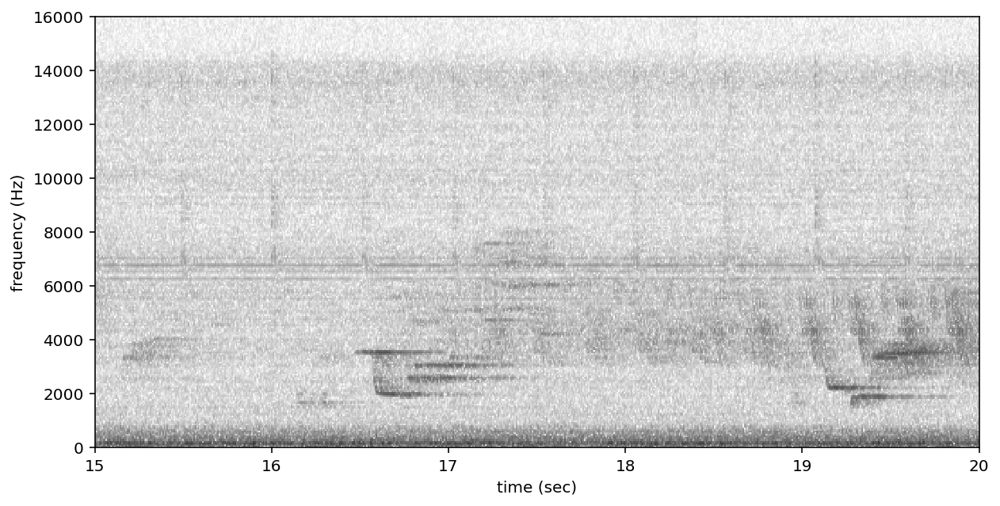

score for Ovenbird class [0-1]: 0.994


Exception ignored in: <function Wave_write.__del__ at 0x7f7700fc33b0>
Traceback (most recent call last):
  File "/usr/lib/python3.7/wave.py", line 327, in __del__
    self.close()
  File "/usr/lib/python3.7/wave.py", line 445, in close
    self._ensure_header_written(0)
  File "/usr/lib/python3.7/wave.py", line 465, in _ensure_header_written
    raise Error('sample width not specified')
wave.Error: sample width not specified


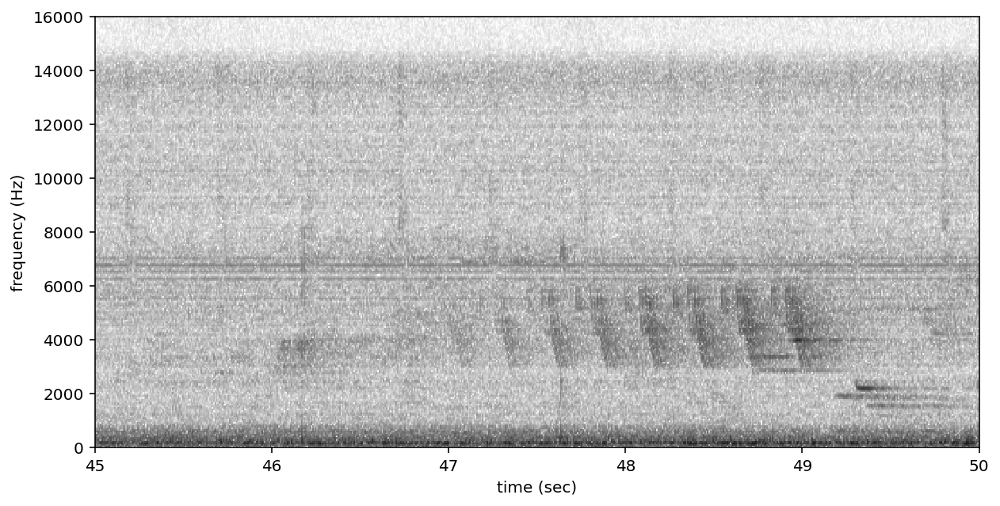

score for Ovenbird class [0-1]: 1.000


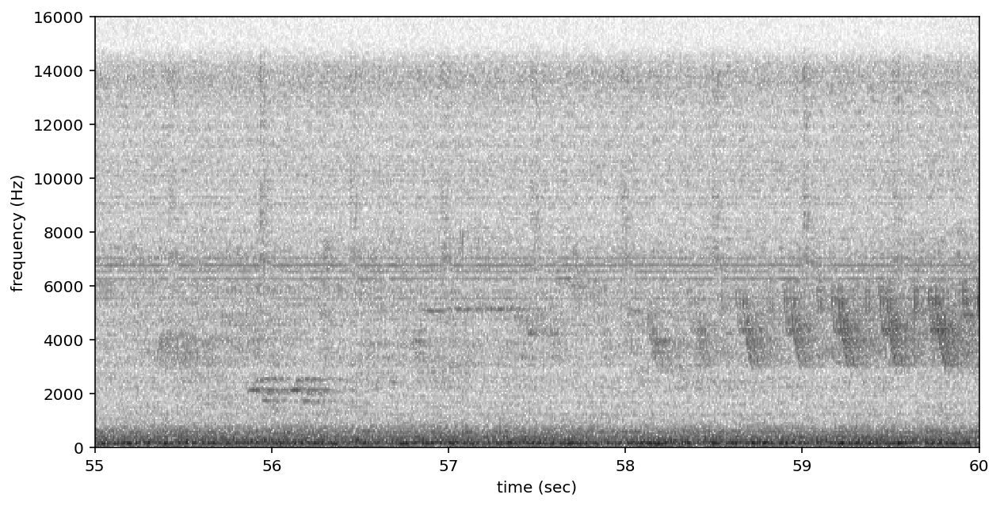

score for Ovenbird class [0-1]: 0.105


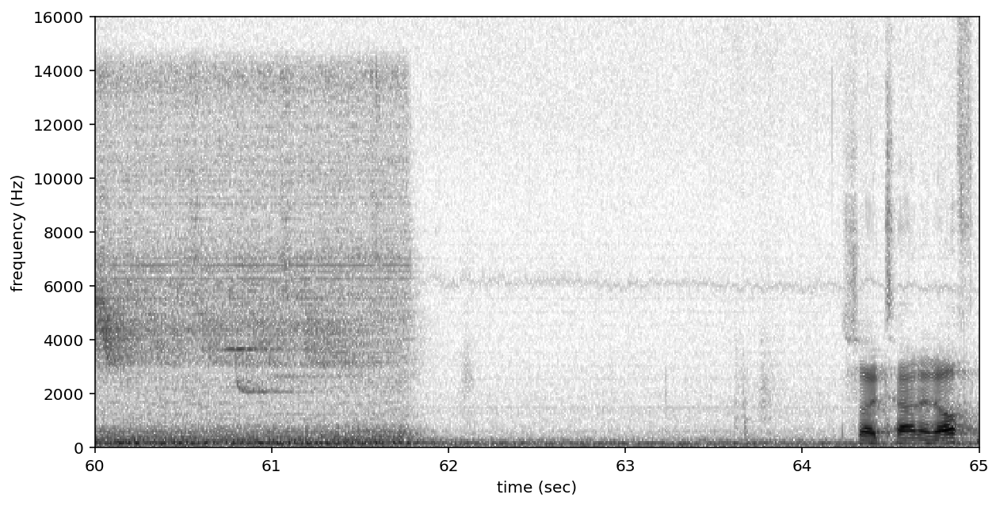

In [ ]:
species = "Ovenbird"
for (file,clip_start_time,clip_end_time), row in preds.iterrows():
  if row[species]>0.1:
    print(f"score for {species} class [0-1]: {row[species]:0.3f}")
    spectrogram.trim(clip_start_time,clip_end_time).plot()
    audio = Audio.from_file(file, offset = clip_start_time, duration = 5)
    ipd.display(ipd.Audio(audio.samples, rate = 32000))

Repeat this analysis with a species of your choice. The text you type must exactly match one of the species names in the model, including capitalization and punctuation. See the list below for all options.

In [ ]:
model.classes

['Red-winged Blackbird',
 'Tufted Titmouse',
 'Cedar Waxwing',
 'Canada Goose',
 'Red-Shouldered Hawk',
 'Northern Cardinal',
 'Verry',
 'Hermit Thrush',
 "Swainson's Thrush",
 'Brown Creeper',
 'Yellow-bellied Cuckoo',
 'Northern Flicker',
 'Eastern Wood-pewee',
 'American Crow',
 'Common Raven',
 'Blue Jay',
 'Downy Woodpecker',
 'Pileated Woodpecker',
 'Kentucky Warbler',
 'Common Yellowthroat',
 'Wood Thrush',
 'Baltimore Oriole',
 'Nashville Warbler',
 'Hairy Woodpecker',
 'Red-bellied Woodpecker',
 'Wild Turkey',
 'Black-and-white Warbler',
 'Brown-headed Cowbird',
 'Louisiana Waterthrush',
 'Rose-breasted Grosbeak',
 'Eastern Towhee',
 'Scarlet Tanager',
 'Black-capped Chickadee',
 'Blue-gray Gnatcatcher',
 'Ruby-crowned Kinglet',
 'Ovenbird',
 'Hooded Warbler',
 'Blackburnian Warbler',
 'Chestnut-sided Warbler',
 'American Redstart',
 'Black-throated Green Warbler',
 'White-breasted Nuthatch',
 'American Goldfinch',
 'Carolina Wren',
 'American Robin',
 'Blue-winged Warbler',
 

In [ ]:
species = "ENTER SPECIES NAME HERE"

if sum(preds[species] > 0.1) ==0:
  print("No scores above 0.1 for this species")

for (file,clip_start_time,clip_end_time), row in preds.iterrows():
  if row[species]>0.1:
    print(f"score for {species} class [0-1]: {row[species]:0.3f}")
    spectrogram.trim(clip_start_time,clip_end_time).plot()
    audio = Audio.from_file(file, offset = clip_start_time, duration = 5)
    ipd.display(ipd.Audio(audio.samples, rate = 32000))

## What is the classifier actually seeing?
Classifiers don't actually get to use the nice big spectrograms we have been plotting so far. Instead, they have to work with a much smaller image size constrained by the architecture of the model. For example the popular `ResNet` CNN architectures require `224x224` pixel images. Lets take a look at the images the model is actually making predictions on:



In [ ]:
from opensoundscape.preprocess.utils import show_tensor_grid, show_tensor
from opensoundscape.torch.datasets import AudioSplittingDataset

In [ ]:
dataset = AudioSplittingDataset([filename], model.preprocessor)
# augmentation is something that happens during training time, so we're going to turn it off here
dataset.bypass_augmentations = True

The image is really just a matrix of pixel intensity values, normalized so that they are 0-centered. Lets look at these pixel intensity values and plot the first five spectrograms as actually seen by the model.

In [ ]:
tensors = [dataset[i]['X'].expand(3,224,224) for i in range(5,10)]
tensors[0]

tensor([[[-0.5886, -0.4345, -0.4619,  ..., -0.4275, -0.5273, -0.4922],
         [-0.6528, -0.5107, -0.4950,  ..., -0.4253, -0.5498, -0.4415],
         [-0.5939, -0.5895, -0.4803,  ..., -0.4060, -0.5281, -0.4323],
         ...,
         [ 0.3346,  0.3727,  0.3471,  ...,  0.3640,  0.1523,  0.4127],
         [ 0.0829,  0.2184,  0.2771,  ...,  0.1707,  0.1008,  0.2143],
         [-0.3558,  0.0461,  0.1976,  ..., -0.0519, -0.0101,  0.0483]],

        [[-0.5886, -0.4345, -0.4619,  ..., -0.4275, -0.5273, -0.4922],
         [-0.6528, -0.5107, -0.4950,  ..., -0.4253, -0.5498, -0.4415],
         [-0.5939, -0.5895, -0.4803,  ..., -0.4060, -0.5281, -0.4323],
         ...,
         [ 0.3346,  0.3727,  0.3471,  ...,  0.3640,  0.1523,  0.4127],
         [ 0.0829,  0.2184,  0.2771,  ...,  0.1707,  0.1008,  0.2143],
         [-0.3558,  0.0461,  0.1976,  ..., -0.0519, -0.0101,  0.0483]],

        [[-0.5886, -0.4345, -0.4619,  ..., -0.4275, -0.5273, -0.4922],
         [-0.6528, -0.5107, -0.4950,  ..., -0

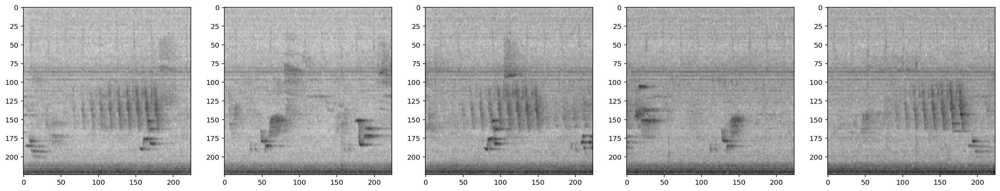

In [ ]:
_ = show_tensor_grid(tensors,5)

### Data augmentation
There are steps you can take during training to improve the performance of your classifier. An important one is data augmentation - augmenting the spectrogram images so that the effective size of the dataset increases. You can add noise, move the image off center and add bars that occlude part of the image. Ideally these augmentations make it harder for the model to just memorize examples from the training set amd instead really learn the features of the spectrogram that really identify the classes. We turn these augmentations off during prediction - but to give a sense of what these augmentations look like we've displayed some below.

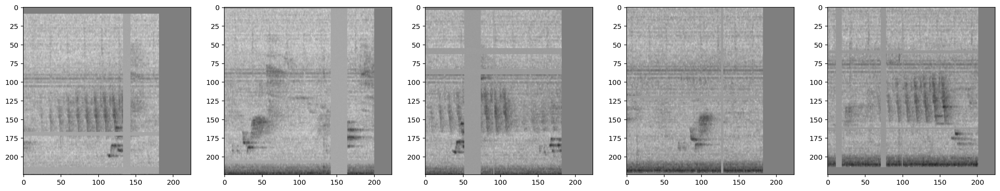

In [ ]:
dataset.bypass_augmentations = False
# We will bypass overlay here - but it allows you to overlay another sound on
# top of the current spectrogram
dataset.preprocessor.pipeline.overlay.bypass = True
tensors = [dataset[i]['X'].expand(3,224,224) for i in range(5,10)]
_ = show_tensor_grid(tensors,5)